In [1]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#!pip install dataprep
from dataprep.eda import create_report
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
#!pip install category_encoders
import category_encoders as ce
#!pip install imblearn
from sklearn.preprocessing import OneHotEncoder
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import cohen_kappa_score
#!pip install xgboost
from xgboost import XGBClassifier

#Grid search
#from sklearn.grid_search import GridSearchCV
from sklearn.model_selection import *



NumExpr defaulting to 8 threads.


In [2]:
#Train data
train = pd.read_csv('C:/Users/gdiaz/Desktop/GDA/kaggle/Churn/customer-churn-prediction-2020/train.csv')
#Test data
test = pd.read_csv('C:/Users/gdiaz/Desktop/GDA/kaggle/Churn/customer-churn-prediction-2020/test.csv')



  0%|          | 0/3347 [00:00<?, ?it/s]

DataPrep Report
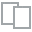
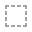
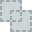
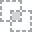
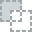
...
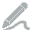
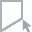
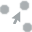
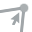
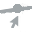

In [3]:
#Report from dataprep.eda
create_report(train)

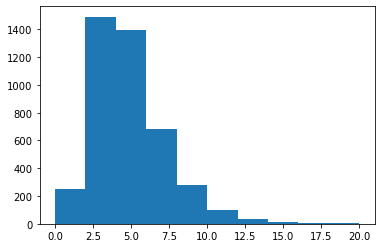

In [4]:
plt.hist(train['total_intl_calls'])
#Transform total_intl_calls to sqrt to approximate to a normal distribution
train['sqrt_total_intl_calls'] = np.sqrt(train['total_intl_calls'])
test['sqrt_total_intl_calls'] = np.sqrt(test['total_intl_calls'])

(array([  22.,    0.,  226., 1491.,  795., 1278.,  279.,  115.,   37.,
           7.]),
 array([0.        , 0.4472136 , 0.89442719, 1.34164079, 1.78885438,
        2.23606798, 2.68328157, 3.13049517, 3.57770876, 4.02492236,
        4.47213595]),
 <BarContainer object of 10 artists>)

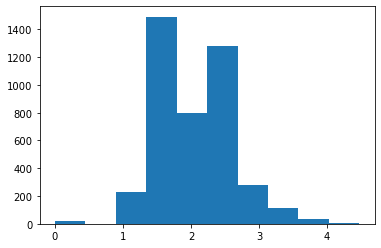

In [5]:
plt.hist(train['sqrt_total_intl_calls'])

In [6]:
#sns.boxplot(train.account_length, groupby=train.churn)

#test['churn2'] = np.where(test['churn']=='yes', 1, 0)
#sns.boxplot(train.account_length,groupby=train.churn2)
#train.boxplot(column = ['account_length'],by='churn2')

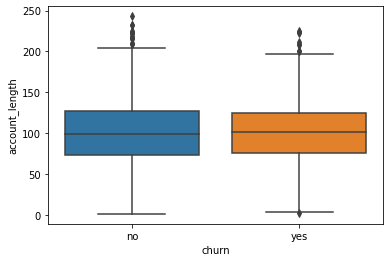

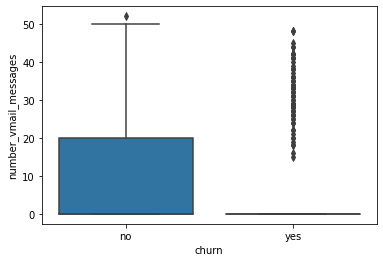

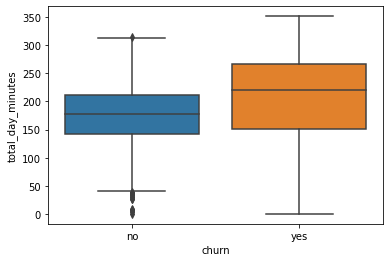

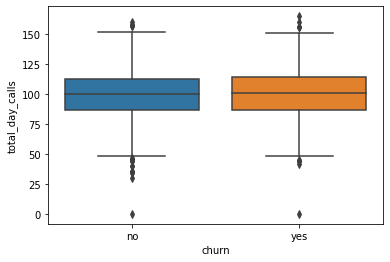

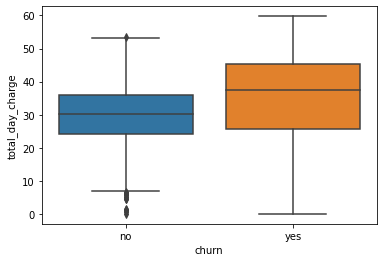

...

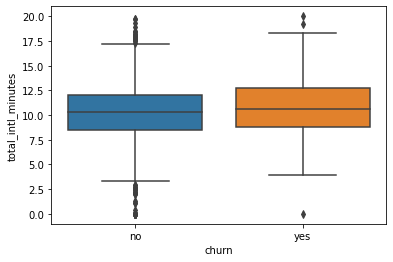

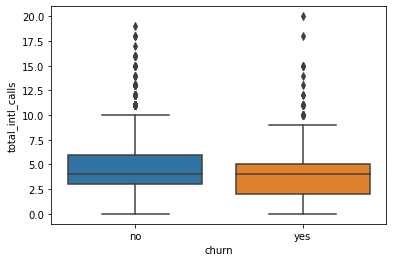

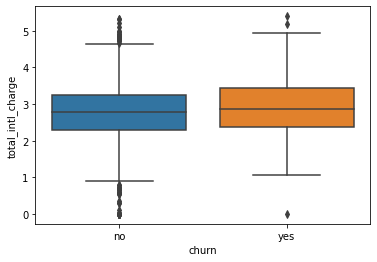

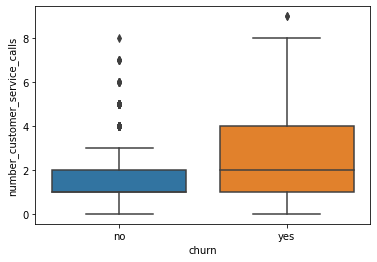

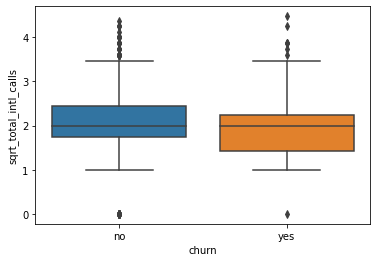

In [7]:
#for col in train.columns:
#    print(col)
col_real = list([1,*range(5,19),20])
col_real = np.array(col_real)

#list(range(5,20))
#Now I have the real vectors I am going to make a boxplot of each real variable groupby Churn
for i in col_real:
    var = train.iloc[:,i]
    churn = train.churn
    sns.boxplot(x=churn,y=var,orient='v')
    plt.show()


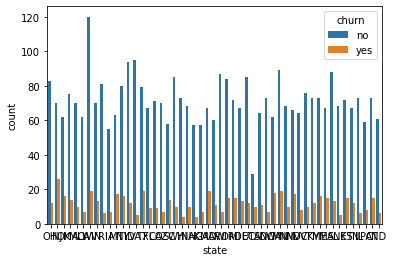

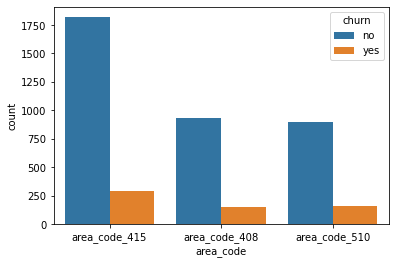

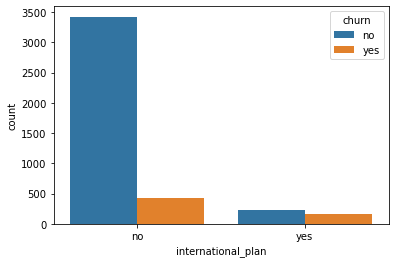

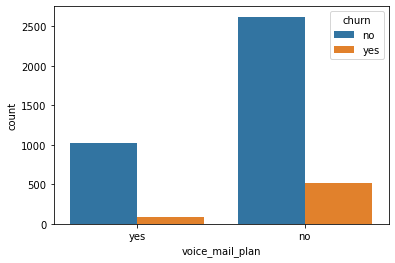

In [8]:
#train['churn'] = np.where(train['churn']=='yes', 1, 0)
sns.countplot(x="state", hue="churn", data=train)
plt.show()
sns.countplot(x="area_code", hue="churn" ,data=train)
plt.show()
sns.countplot(x="international_plan", hue="churn", data=train)
plt.show()
sns.countplot(x="voice_mail_plan", hue="churn", data=train)
plt.show()

# Bivariate Analysis
https://www.kaggle.com/dileepsahu/customer-churn-prediction-with-96-44-accuracy/notebook

Text(0.5, 1.0, 'Churn rate VS account_length')

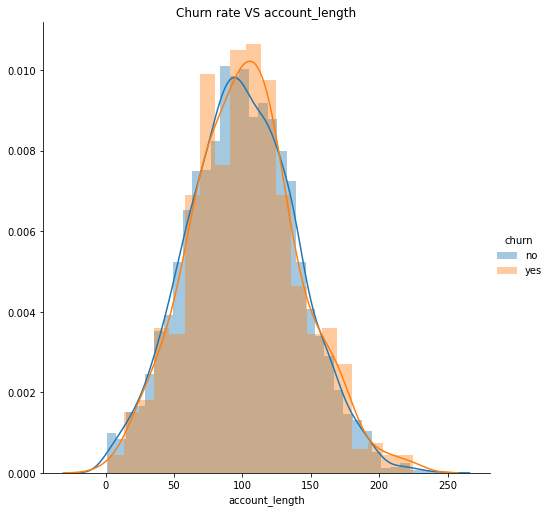

In [9]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'account_length').add_legend()
plt.title('Churn rate VS account_length')

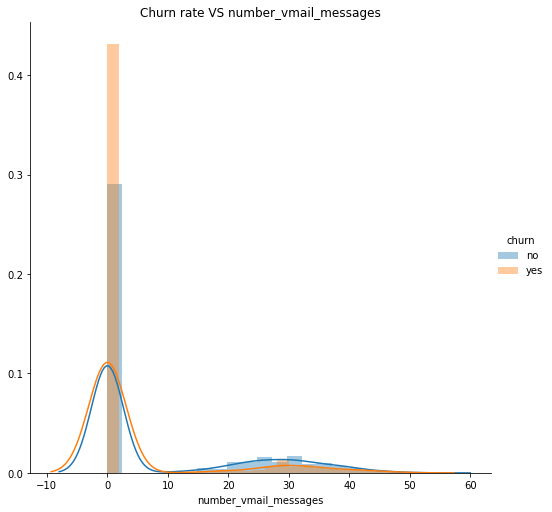

In [10]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'number_vmail_messages').add_legend()
plt.title('Churn rate VS number_vmail_messages')
plt.show()

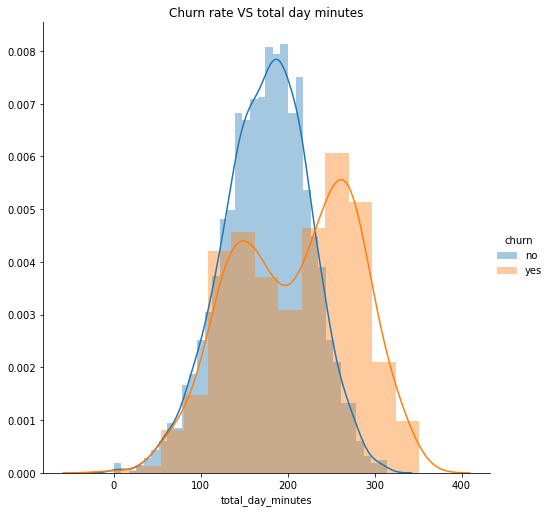

In [11]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'total_day_minutes').add_legend()
plt.title('Churn rate VS total day minutes')
plt.show()

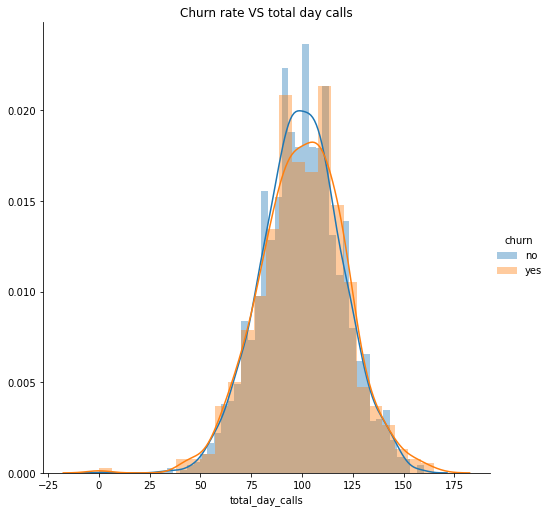

In [12]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'total_day_calls').add_legend()
plt.title('Churn rate VS total day calls')
plt.show()

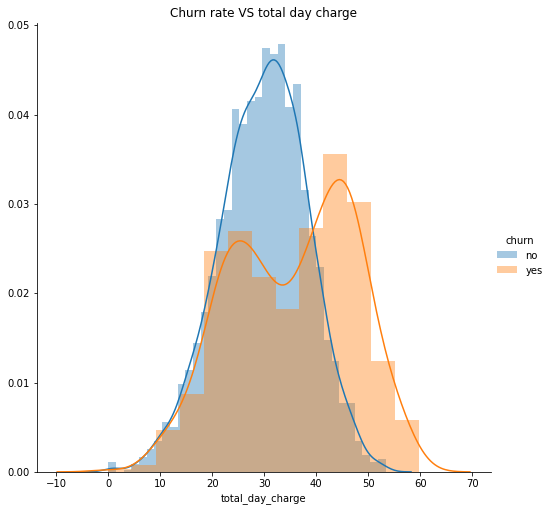

In [13]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'total_day_charge').add_legend()
plt.title('Churn rate VS total day charge')
plt.show()

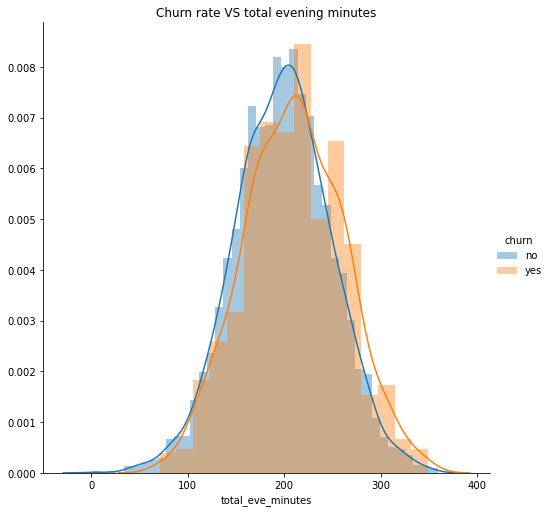

In [14]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'total_eve_minutes').add_legend()
plt.title('Churn rate VS total evening minutes')
plt.show()

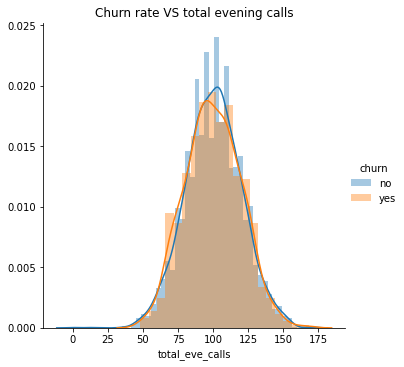

In [15]:
sns.FacetGrid(train, hue='churn',size=5).map(sns.distplot, 'total_eve_calls').add_legend()
plt.title('Churn rate VS total evening calls')
plt.show()

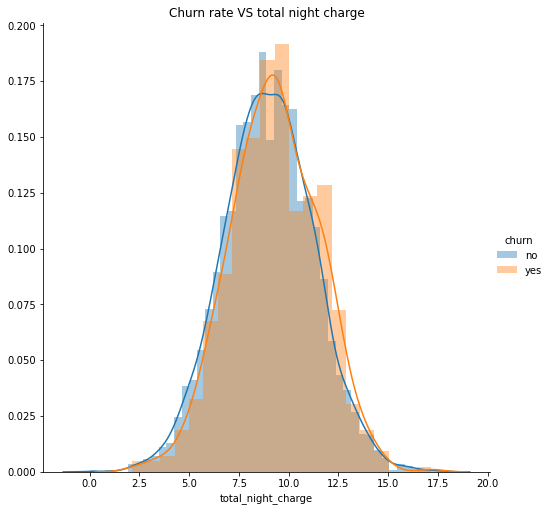

In [16]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'total_night_charge').add_legend()
plt.title('Churn rate VS total night charge')
plt.show()

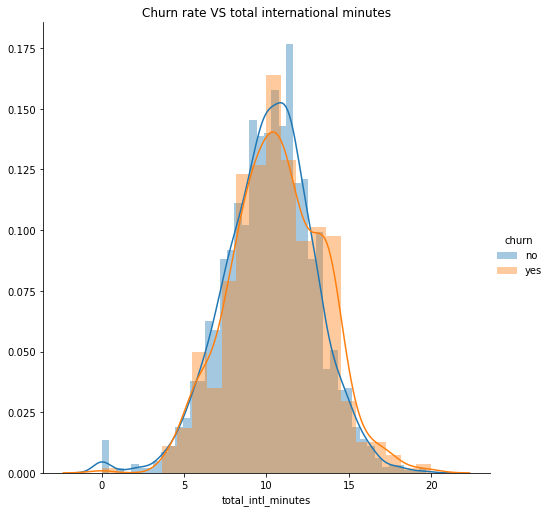

In [17]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'total_intl_minutes').add_legend()
plt.title('Churn rate VS total international minutes')
plt.show()

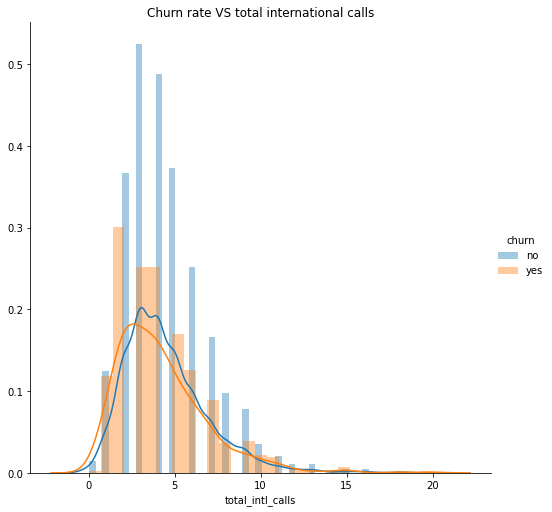

In [18]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'total_intl_calls').add_legend()
plt.title('Churn rate VS total international calls')
plt.show()

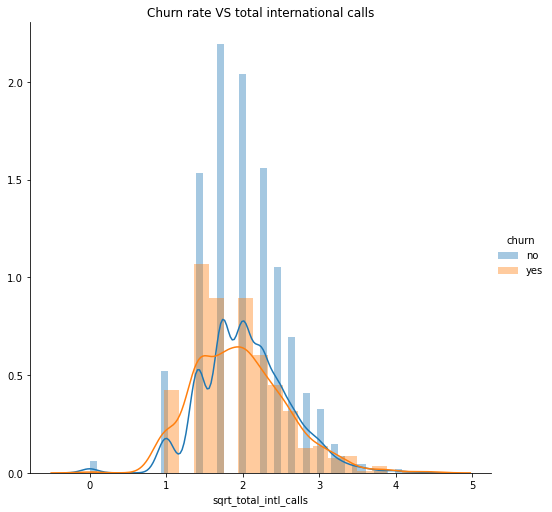

In [19]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'sqrt_total_intl_calls').add_legend()
plt.title('Churn rate VS total international calls')
plt.show()

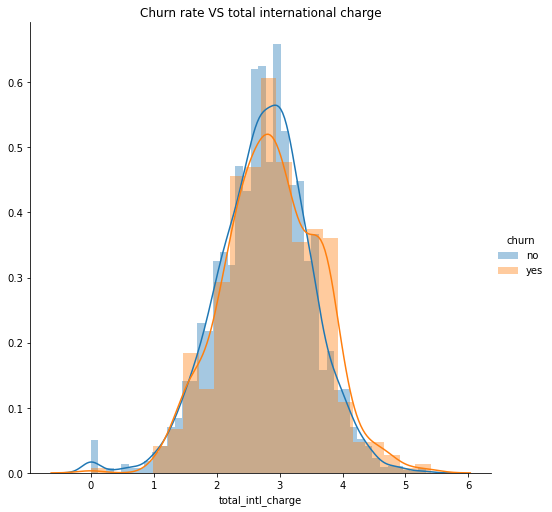

In [20]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'total_intl_charge').add_legend()
plt.title('Churn rate VS total international charge')
plt.show()

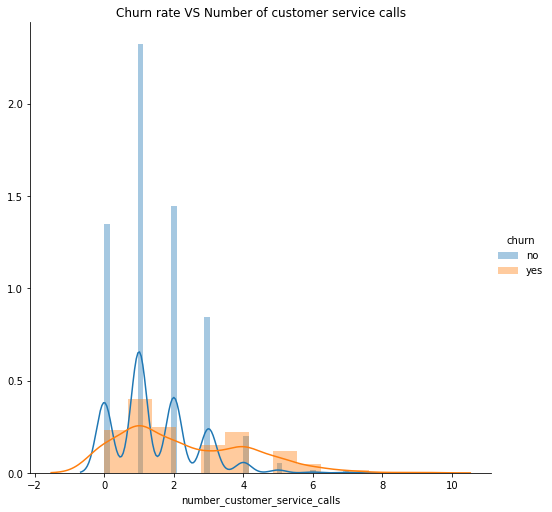

In [21]:
sns.FacetGrid(train, hue='churn',size=7).map(sns.distplot, 'number_customer_service_calls').add_legend()
plt.title('Churn rate VS Number of customer service calls')
plt.show()

# Outlier detection

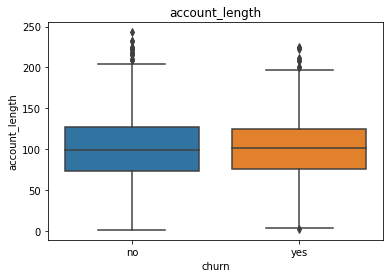

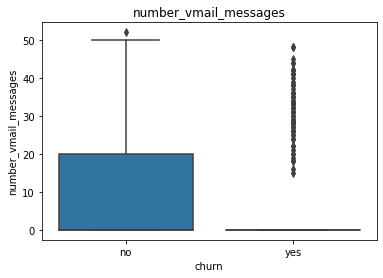

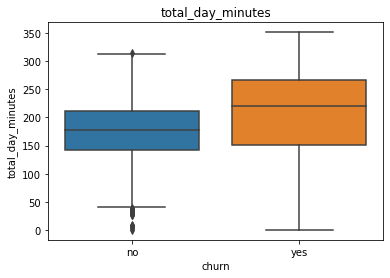

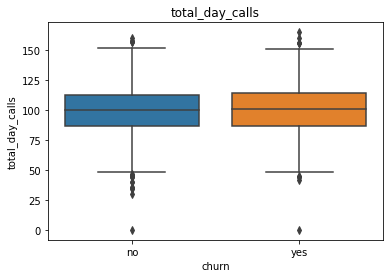

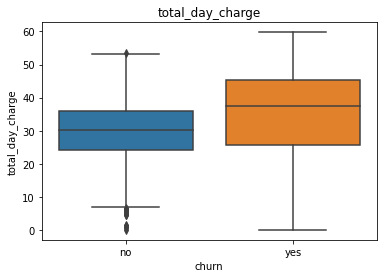

...

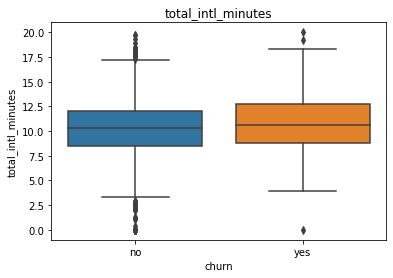

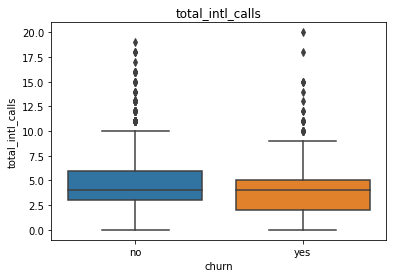

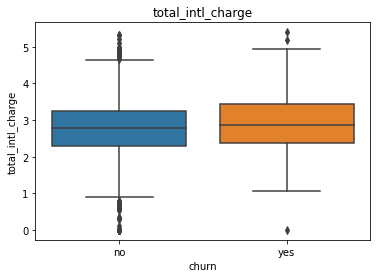

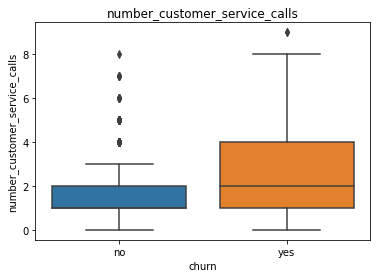

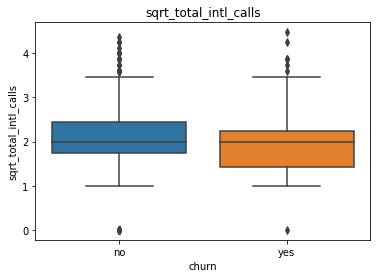

In [22]:
#Extract the numerical features from the dataset
num_var = [feature for feature in train.columns if train[feature].dtypes != 'O']
for feature in num_var:
    if feature != 'churn':
        sns.boxplot(x ='churn', y = feature, data = train)
        plt.title(feature)
        plt.show()

# Removing outliers

In [23]:
#functions for removing outliers
def remove_outliers(train,labels):
    for label in labels:
        q1 = train[label].quantile(0.25)
        q3 = train[label].quantile(0.75)
        iqr = q3 - q1
        upper_bound = q3 + 1.5 * iqr
        lower_bound = q1 - 1.5 * iqr
        train[label] = train[label].mask(train[label]< lower_bound, train[label].median(),axis=0)
        train[label] = train[label].mask(train[label]> upper_bound, train[label].median(),axis=0)

    return train

In [24]:
train = remove_outliers(train, num_var)

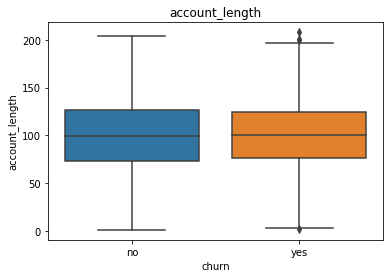

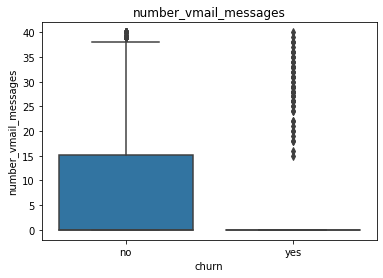

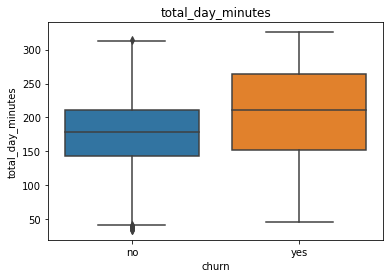

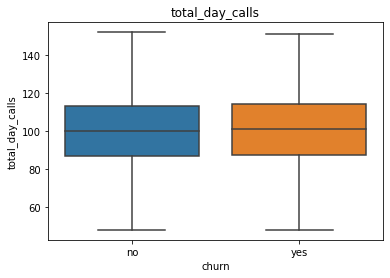

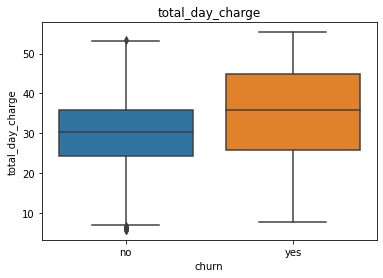

...

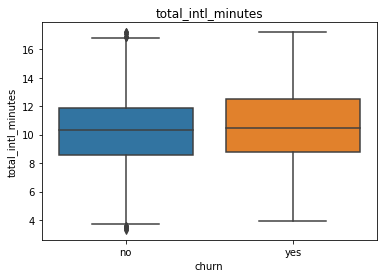

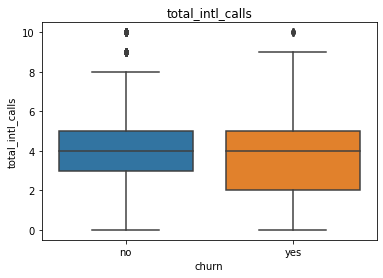

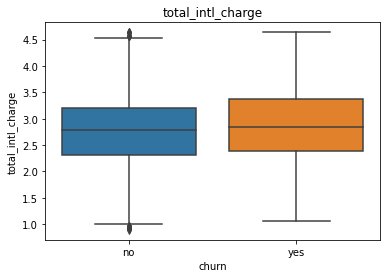

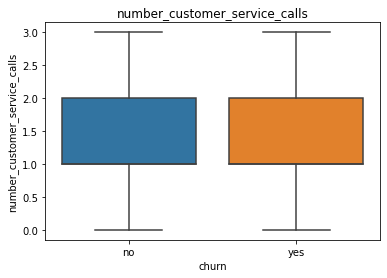

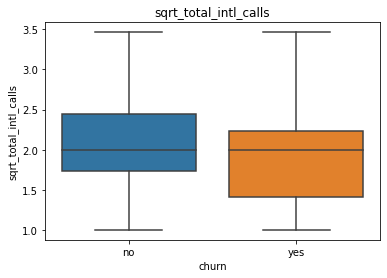

In [25]:
#after removing the outliers we have to see the outliers
for feature in num_var:
    if feature != 'churn':
        sns.boxplot(x ='churn', y = feature, data = train)
        plt.title(feature)
        plt.show()

In [26]:
#state feature has 51 different category so we can't converted into onehot encoder
#that is it create 51 different features so it leads to overfitting so I will use the hashing encoding for state featuer.

hash_state = ce.HashingEncoder(cols = 'state')
train = hash_state.fit_transform(train)
test = hash_state.transform(test)
#Search for the HashingEncoder

In [27]:
# replace no to 0 and yes to 1
train.international_plan.replace(['no','yes'],[0,1],inplace = True)
train.voice_mail_plan.replace(['no','yes'],[0,1],inplace=True)
train.churn.replace(['no','yes'],[0,1],inplace = True)
test.international_plan.replace(['no','yes'],[0,1],inplace = True)
test.voice_mail_plan.replace(['no','yes'],[0,1],inplace = True)

In [28]:
# converting the area_code to numerical variable using one-hot encoder
onehot_area = OneHotEncoder()
onehot_area.fit(train[['area_code']])

# Train
encoded_values = onehot_area.transform(train[['area_code']])
train[onehot_area.categories_[0]] = encoded_values.toarray()
train = train.drop('area_code', axis=1)

# Test
encoded_values = onehot_area.transform(test[['area_code']])
test[onehot_area.categories_[0]] = encoded_values.toarray()
test = test.drop('area_code', axis=1)

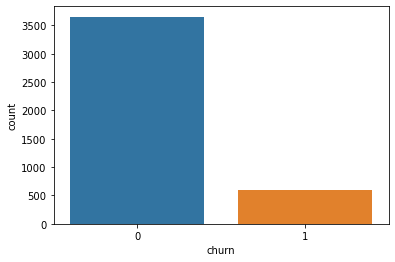

In [29]:
# showing the imbalanced class
sns.countplot(x = 'churn', data = train)
plt.show()

In [30]:
x = train.drop('churn',axis=1).values
y = train.churn.values
id_submission = test.id
test = test.drop('id', axis=1)
# spliting the data into test and train
x_train, x_test , y_train, y_test = train_test_split(x, y , test_size=0.3, random_state=0)

In [31]:
print('Before upsampling count of label 0 {}'.format(sum(y_train==0)))
print('Before upsampling count of label 1 {}'.format(sum(y_train==1)))
# Minority Over Sampling Technique
sm = SMOTE(sampling_strategy = 1, random_state=1)   
x_train_s, y_train_s = sm.fit_resample(x_train, y_train.ravel())
                                         
print('After upsampling count of label 0 {}'.format(sum(y_train_s==0)))
print('After upsampling count of label 1 {}'.format(sum(y_train_s==1)))

Before upsampling count of label 0 2447
Before upsampling count of label 1 400
After upsampling count of label 0 2447
After upsampling count of label 1 2447


In [32]:
# creating the object of minmax scaler
scaler = MinMaxScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)
test = scaler.transform(test)

# Building the model

In [33]:
clf = XGBClassifier(max_depth=7, n_estimators=200, colsample_bytree=0.7, 
                        subsample=0.8, nthread=10, learning_rate=0.01)
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)
print('Accuracy: ')
print('{}'.format(accuracy_score(y_test, y_pred)))
print('Classification report: ')
print('{}'.format(classification_report(y_test, y_pred)))
print('Confusion Matrix')
print('{}'.format(confusion_matrix(y_test, y_pred)))
print('Cohen kappa score: ')
print('{}'.format(cohen_kappa_score(y_test, y_pred)))

[11:40:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 
0.9237348538845331
Classification report: 
              precision    recall  f1-score   support

           0       0.92      1.00      0.96      1205
           1       0.96      0.48      0.64       198

    accuracy                           0.92      1403
   macro avg       0.94      0.74      0.80      1403
weighted avg       0.93      0.92      0.91      1403

Confusion Matrix
[[1201    4]
 [ 103   95]]
Cohen kappa score: 
0.6023147817010917


# Submission

In [34]:
y_pred_sub = clf.predict(test)
submit = pd.DataFrame({'id':id_submission, 'churn':y_pred_sub})
submit.head()
# replace 0 to no and 1 to yes
submit.churn.replace([0,1],['no','yes'], inplace=True)
submit.to_csv('churn_submit.csv',index=False)

# Grid Search

In [35]:
xgb_model = XGBClassifier()

#brute force scan for all parameters, here are the tricks
#usually max_depth is 6,7,8
#learning rate is around 0.05, but small changes may make big diff
#tuning min_child_weight subsample colsample_bytree can have 
#much fun of fighting against overfit 
#n_estimators is how many round of boosting
#finally, ensemble xgboost with multiple seeds may reduce variance
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['binary:logistic'],
              'learning_rate': [0.005,0.01,0.05,0.1,0.15,0.2], #so called `eta` value
              'max_depth': [4,5,6,7],
              'min_child_weight': [11],
              'silent': [1],
              'subsample': [0.8],
              'colsample_bytree': [0.7],
              'n_estimators': [5,6,7,200,300], #number of trees, change it to 1000 for better results
              'missing':[-999],
              'seed': [1337]}


clf = GridSearchCV(xgb_model, parameters, n_jobs=5, 
                   cv=StratifiedKFold(n_splits=5, shuffle=True), 
                   scoring='roc_auc',
                   verbose=2, refit=True)

clf.fit(x_train, y_train)

#trust your CV!
#best_parameters, score, _ = max(clf.cv_results_, key=lambda x: x[1])
#print('Raw AUC score:', score)
#for param_name in sorted(best_parameters.keys()):
#    print("%s: %r" % (param_name, best_parameters[param_name]))

y_pred = clf.predict_proba(x_test)
y_pred = clf.predict(x_test)
print('Accuracy: ')
print('{}'.format(accuracy_score(y_test, y_pred)))
print('Classification report: ')
print('{}'.format(classification_report(y_test, y_pred)))
print('Confusion Matrix')
print('{}'.format(confusion_matrix(y_test, y_pred)))
print('Cohen kappa score: ')
print('{}'.format(cohen_kappa_score(y_test, y_pred)))

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[11:41:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:576: 
Parameters: { "silent" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[11:41:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy: 
0.9109052031361369
Classification report: 
              precision    recall  f1-score   support

           0       0.91      0.99      0.95      1205
           1       0.92      0.40      0.56      

In [36]:
#xgb_model = XGBClassifier()
xgb_estimator = XGBClassifier(objective='binary:logistic',
                                  seed=24,
                                  subsample=0.9,
                                  colsample_bytree=0.5)


In [37]:
param_grid = {
    'max_depth' : [4,5,6,7],
    'objective':['binary:logistic'],
    'learning_rate': [0.005,0.01,0.05,0.1,0.15,0.2],
    'n_estimators' : [5,6,7,200,300],
    'subsample': [0.8],
    'colsample_bytree': [0.7],
    'max_depth': [4,5,6,7,8,9,10],
    'min_child_weight': [11]
}

clf_xgb_tuned = GridSearchCV(estimator=xgb_estimator,
                             param_grid=param_grid,
                             scoring='roc_auc',
                             verbose=2,
                             n_jobs=-1,
                             cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=24)
)

In [38]:
clf_xgb_tuned.fit(x_train,
                  y_train,
                  verbose=True,
                  early_stopping_rounds=10,
                  eval_metric='aucpr',
           eval_set=[(x_test, y_test)]
)

Fitting 5 folds for each of 210 candidates, totalling 1050 fits
[0]	validation_0-aucpr:0.48381
[1]	validation_0-aucpr:0.49093
[2]	validation_0-aucpr:0.50819
[3]	validation_0-aucpr:0.50937
[4]	validation_0-aucpr:0.50025
[5]	validation_0-aucpr:0.50181
[6]	validation_0-aucpr:0.56577
[7]	validation_0-aucpr:0.59132
[8]	validation_0-aucpr:0.62277
[9]	validation_0-aucpr:0.63322
[10]	validation_0-aucpr:0.64290
[11]	validation_0-aucpr:0.64175
[12]	validation_0-aucpr:0.64575
[13]	validation_0-aucpr:0.64470
[14]	validation_0-aucpr:0.65560
[15]	validation_0-aucpr:0.65639
[16]	validation_0-aucpr:0.66879
[17]	validation_0-aucpr:0.66795
[18]	validation_0-aucpr:0.67119
[19]	validation_0-aucpr:0.67346
[20]	validation_0-aucpr:0.67599
[21]	validation_0-aucpr:0.67263
[22]	validation_0-aucpr:0.67888
[23]	validation_0-aucpr:0.67702
[24]	validation_0-aucpr:0.67541
[25]	validation_0-aucpr:0.67390
[26]	validation_0-aucpr:0.67558
[27]	validation_0-aucpr:0.67682
[28]	validation_0-aucpr:0.67776
[29]	validation_0-

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=24, shuffle=True),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=0.5,
                                     enable_categorical=False, gamma=None,
                                     gpu_id=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_ch...
                                     reg_lambda=None, scale_pos_weight=None,
                                     seed=24, subsample=0.9, tree_method=None,
                                     validate_parameters=None, verbosity=None),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.7],
         

In [39]:
y_pred = clf_xgb_tuned.predict(x_test)
print('Accuracy: ')
print('{}'.format(accuracy_score(y_test, y_pred)))
print('Classification report: ')
print('{}'.format(classification_report(y_test, y_pred)))
print('Confusion Matrix')
print('{}'.format(confusion_matrix(y_test, y_pred)))
print('Cohen kappa score: ')
print('{}'.format(cohen_kappa_score(y_test, y_pred)))

Accuracy: 
0.9123307198859587
Classification report: 
              precision    recall  f1-score   support

           0       0.91      0.99      0.95      1205
           1       0.88      0.44      0.59       198

    accuracy                           0.91      1403
   macro avg       0.90      0.71      0.77      1403
weighted avg       0.91      0.91      0.90      1403

Confusion Matrix
[[1193   12]
 [ 111   87]]
Cohen kappa score: 
0.5428478331704139


In [40]:
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

           0       0.99      0.91      0.95      1304
           1       0.44      0.88      0.59        99

    accuracy                           0.91      1403
   macro avg       0.71      0.90      0.77      1403
weighted avg       0.95      0.91      0.93      1403



In [41]:
# Submission
clf = XGBClassifier(max_depth=7, n_estimators=200, colsample_bytree=0.7, 
                        subsample=0.8, nthread=10, learning_rate=0.01)
clf.fit(x_train, y_train)


[11:42:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7,
              enable_categorical=False, gamma=0, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.01, max_delta_step=0, max_depth=7,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=200, n_jobs=10, nthread=10, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=0.8, tree_method='exact',
              validate_parameters=1, verbosity=None)

In [42]:
y_pred_sub = clf.predict(test)

In [43]:
submit = pd.DataFrame({'id':id_submission, 'churn':y_pred_sub})
submit.head()

,id,churn
0,1,0
1,2,0
2,3,0
3,4,0
4,5,0


In [44]:
# replace 0 to no and 1 to yes
submit.churn.replace([0,1],['no','yes'], inplace=True)
submit.to_csv('churn_submit2.csv',index=False)